## Preparing JUMP Cell Painting Dataset for μSplit ##


In this notebook we will do the following:
1. Lazy-loading the JUMP CRISPR dataset
2. Getting basic metadata about the dataset
3. Retrieving and visualizing image channels
4. Preparing images for μSplit analysis

### We prepare images and combine the number of specified channels, for the specified genes from the dataset.The JUMP datasets are designed specifically to have 5 channels, with 6 dyes to reveal 8 cellular components, via a microscopy assay called Cell Painting. You can find more information about the datasets here: https://jump-cellpainting.broadinstitute.org/

In [1]:
# Install packages and libraries
!pip install jump_deps matplotlib numpy
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
from jump_portrait.fetch import get_item_location_info, get_jump_image
import matplotlib.colors as mpl

## Load the dataset - using CRISPR dataset here

In [2]:
# Lazy load the JUMP dataset 
INDEX_FILE = "https://raw.githubusercontent.com/jump-cellpainting/datasets/50cd2ab93749ccbdb0919d3adf9277c14b6343dd/manifests/profile_index.csv"
profile_index = pl.read_csv(INDEX_FILE)

# Filter for CRISPR dataset
crispr_info = profile_index.filter(pl.col("subset") == "crispr")
CRISPR_URL = crispr_info.item(0, "url")
profiles = pl.scan_parquet(CRISPR_URL)

## Get metadata about the dataset

In [3]:
# Info about profile data
print("=== JUMP CRISPR Profile Data ===")
meta_cols = profiles.select(pl.col("^Metadata.*$")).collect_schema().names()
profile_rows = profiles.select(pl.len()).collect().item()
profile_cols = profiles.collect_schema().len()
print(f"Number of profiles: {profile_rows}")
print(f"Number of features: {profile_cols}")
print(f"Number of metadata columns: {len(meta_cols)}")

# Sample of unique genes in dataset
unique_genes = profiles.select("Metadata_JCP2022").unique().collect().to_series()
print(f"\nTotal unique perturbations: {len(unique_genes)}")
print("Sample perturbations:")
print(unique_genes.sample(5, seed=42))

=== JUMP CRISPR Profile Data ===
Number of profiles: 51185
Number of features: 263
Number of metadata columns: 4

Total unique perturbations: 7977
Sample perturbations:
shape: (5,)
Series: 'Metadata_JCP2022' [str]
[
	"JCP2022_803981"
	"JCP2022_805060"
	"JCP2022_800836"
	"JCP2022_803491"
	"JCP2022_804073"
]


## Get image information

In [4]:
sample_gene = "RAB30"  # Using gene RAB30 as an example
gene_info = get_item_location_info(sample_gene)

print("\n=== JUMP Image Data ===")
print(f"Number of images for {sample_gene}: {gene_info.shape[0]}")

sample_row = gene_info.filter(pl.col("Metadata_PlateType") == "CRISPR").row(0)
source = sample_row[gene_info.columns.index("Metadata_Source")]
batch = sample_row[gene_info.columns.index("Metadata_Batch")]
plate = sample_row[gene_info.columns.index("Metadata_Plate")]
well = sample_row[gene_info.columns.index("Metadata_Well")]
site = sample_row[gene_info.columns.index("Metadata_Site")]

# Get sample image and print dimensions
sample_image = get_jump_image(source, batch, plate, well, "DNA", site, None)
print(f"Image dimensions: {sample_image.shape}")
print(f"Available channels: DNA, RNA, ER, AGP, Mito")

worker #4: 100%|██████████| 2/2 [00:12<00:00,  6.03s/it]



=== JUMP Image Data ===
Number of images for RAB30: 90
Image dimensions: (1080, 1280)
Available channels: DNA, RNA, ER, AGP, Mito


## Visualize channels for a specific image

In [5]:
def display_all_channels(source, batch, plate, well, site, title=None):  # move to dataset specific scripts
    """
    Retrieve and display all 5 channels for a specific image with their biological colors
    but preserving raw intensity values
    
    Parameters:
    -----------
    source, batch, plate, well, site: str
        Location parameters for the image
    title: str, optional
        Optional title for the figure
    """
    channels = ["DNA", "RNA", "ER", "AGP", "Mito"]
    
    # Dye names for each channel
    dye_names = {
        "DNA": "Hoechst 33342",
        "RNA": "SYTO 14",
        "ER": "Concanavalin A",
        "AGP": "Phalloidin/WGA",  # Combined stains
        "Mito": "MitoTracker",
    }
    
    channel_colors = {
        "DNA": "#0000FF",  # Blue
        "RNA": "#FFFF00",  # Yellow
        "ER": "#00FF00",   # Green
        "AGP": "#FF7F00",  # Orange
        "Mito": "#FF0000", # Red
    }
    
    # Create figure with 6 subplots (5 channels + combined)
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    # Store individual channel images for combining later
    channel_images = {}
    
    for i, channel in enumerate(channels):
        img = get_jump_image(source, batch, plate, well, channel, site, None)
        channel_images[channel] = img
        
        cmap = mpl.LinearSegmentedColormap.from_list(channel, ("#000", channel_colors[channel]))
        
        im = axes[i].imshow(img, cmap=cmap, vmin=0, vmax=None)
        axes[i].set_title(f"{channel} Channel ({dye_names[channel]})")
        axes[i].axis('off')
        
        cbar = plt.colorbar(im, ax=axes[i], orientation='vertical',
                     fraction=0.046, pad=0.04)
        cbar.set_label('Intensity', rotation=270, labelpad=15)
    
    # Create combined image using all 5 channels - with proper type conversion
    # Convert all images to float32 first for consistency
    combined_img = np.zeros_like(img, dtype=np.float32)
    for channel in channels:
        # Ensure all images are float32 before combining
        channel_data = channel_images[channel].astype(np.float32)
        combined_img += channel_data / 5.0  # Equal weighting

    im = axes[5].imshow(combined_img, cmap='viridis')
    axes[5].set_title("Combined (All 5 Channels)")
    axes[5].axis('off')
    cbar = plt.colorbar(im, ax=axes[5], orientation='vertical',
                fraction=0.046, pad=0.04)
    cbar.set_label('Intensity (a.u.)', rotation=270, labelpad=15)
    
    if title:
        plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    
    return channel_images

## Visualize channels for a sample image

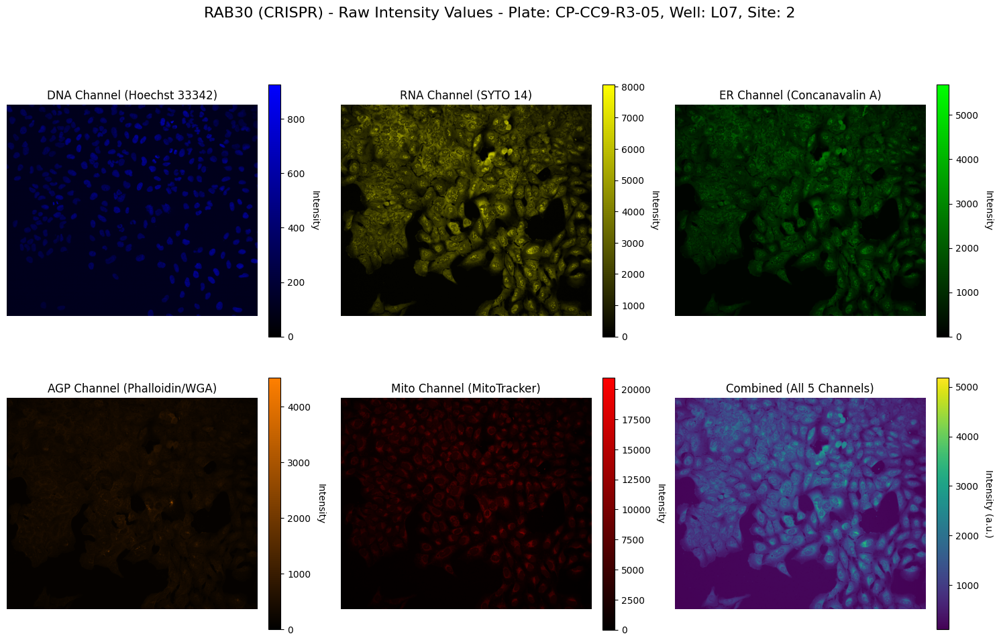

In [6]:
channel_images = display_all_channels(
    source, batch, plate, well, site,
    title=f"{sample_gene} (CRISPR) - Raw Intensity Values - Plate: {plate}, Well: {well}, Site: {site}"
)

## Prepare images for μSplit

In [7]:
import tifffile
import os

def prepare_microsplit_dataset( # move to dataset specific scripts
    gene_list, 
    output_dir="microsplit_dataset",
    images_per_gene=10,
    channels_to_combine=["DNA", "Mito"],
    weights=None,
    normalize=False,
    seed=42
):
    """
    Prepare a dataset for μSplit by combining channels and saving as TIFF files
    
    Parameters:
    -----------
    gene_list: list
        List of genes to include
    output_dir: str
        Directory to save the TIFF files
    images_per_gene: int
        Number of images to retrieve per gene
    channels_to_combine: list
        Channels to combine
    weights: list or None
        Weights for each channel
    normalize: bool
        Whether to normalize intensity values
    seed: int
        Random seed for reproducibility
        
    Returns:
    --------
    dataset_info: dict
        Information about the created dataset
    """
    os.makedirs(output_dir, exist_ok=True)
    os.makedirs(os.path.join(output_dir, "combined"), exist_ok=True)
    for channel in channels_to_combine:
        os.makedirs(os.path.join(output_dir, channel), exist_ok=True)
    
    # Track dataset information
    dataset_info = {
        "combined_images": [],
        "original_images": {},
        "metadata": []
    }
    
    for channel in channels_to_combine:
        dataset_info["original_images"][channel] = []
    
    np.random.seed(seed)
    image_counter = 0
    
    for gene in gene_list:
        print(f"Processing gene: {gene}")
        
        # Get location info for this gene
        gene_info = get_item_location_info(gene)
        
        # Filter for CRISPR perturbations
        crispr_samples = gene_info.filter(pl.col("Metadata_PlateType") == "CRISPR")
        
        # If insufficient images, skip this gene
        if crispr_samples.shape[0] < images_per_gene:
            print(f"  Warning: Only {crispr_samples.shape[0]} images available for {gene}, skipping")
            continue
            
        # Randomly select images
        indices = np.random.choice(
            crispr_samples.shape[0], 
            size=images_per_gene, 
            replace=False
        )
        
        for i in indices:
            row = crispr_samples.row(i)
            source = row[gene_info.columns.index("Metadata_Source")]
            batch = row[gene_info.columns.index("Metadata_Batch")]
            plate = row[gene_info.columns.index("Metadata_Plate")]
            well = row[gene_info.columns.index("Metadata_Well")]
            site = row[gene_info.columns.index("Metadata_Site")]
            
            channel_images = {}
            for channel in channels_to_combine:
                img = get_jump_image(source, batch, plate, well, channel, site, None)
                channel_images[channel] = img
            
            combined_img, _ = combine_channels_for_microsplit(
                channel_images,
                channels_to_combine=channels_to_combine,
                weights=weights,
                normalize=normalize
            )
            
            combined_filename = f"img_{image_counter:05d}_combined.tif"
            combined_path = os.path.join(output_dir, "combined", combined_filename)
            tifffile.imwrite(combined_path, combined_img)
            dataset_info["combined_images"].append(combined_path)
            
            for channel in channels_to_combine:
                channel_filename = f"img_{image_counter:05d}_{channel}.tif"
                channel_path = os.path.join(output_dir, channel, channel_filename)
                tifffile.imwrite(channel_path, channel_images[channel])
                dataset_info["original_images"][channel].append(channel_path)
            
            dataset_info["metadata"].append({
                "image_id": image_counter,
                "gene": gene,
                "source": source,
                "batch": batch,
                "plate": plate,
                "well": well,
                "site": site,
                "combined_channels": channels_to_combine,
                "weights": weights,
                "normalized": normalize
            })
            
            image_counter += 1
    
    print(f"Dataset created with {image_counter} images")
    print(f"  - Combined images saved to: {os.path.join(output_dir, 'combined')}")
    for channel in channels_to_combine:
        print(f"  - {channel} channel images saved to: {os.path.join(output_dir, channel)}")
    return dataset_info

In [8]:
def combine_channels_for_microsplit( # move to dataset specific scripts
    channel_images,
    channels_to_combine=["DNA", "Mito"],
    weights=None,
    normalize=False
):
    """
    Combine multiple channels into a single image for μSplit input
    
    Parameters:
    -----------
    channel_images: dict
        Dictionary containing channel names and their corresponding images
    channels_to_combine: list
        List of channel names to combine
    weights: list or None
        Optional weights for each channel
    normalize: bool
        Whether to normalize intensity values
        
    Returns:
    --------
    combined_img: numpy.ndarray
        Combined image
    stats: dict
        Statistics about the combination process
    """
    import numpy as np
    
    processed_images = {}
    for channel in channels_to_combine:
        img = channel_images[channel].astype(np.float32)
        if normalize:
            img = (img - img.min()) / (img.max() - img.min())
        processed_images[channel] = img
    
    if weights is None:
        weights = [1.0 / len(channels_to_combine)] * len(channels_to_combine)
    
    combined_img = np.zeros_like(processed_images[channels_to_combine[0]])
    for channel, weight in zip(channels_to_combine, weights):
        combined_img += processed_images[channel] * weight
    
    # Collect statistics
    stats = {
        "min_val": combined_img.min(),
        "max_val": combined_img.max(),
        "mean_val": combined_img.mean(),
        "std_val": combined_img.std()
    }
    
    return combined_img, stats

## If you want to use a subset of the CRISPR dataset for training and prediction, you have to specify which channels and genes you want to include. Set the configuration and create the datasets you require.

In [9]:
# Define all available channels
all_channels = ["DNA", "RNA", "ER", "AGP", "Mito"]

# Generate all possible pairs of channels
import itertools
channel_pairs = list(itertools.combinations(all_channels, 2))

# Selected genes
selected_genes = ["RAB30", "KRAS", "TP53", "EGFR", "BRCA1"]

# Create datasets for all channel pairs
for i, (channel1, channel2) in enumerate(channel_pairs):
    output_dir = f"microsplit_{channel1.lower()}_{channel2.lower()}_dataset"
    print(f"\nGenerating dataset {i+1}/10: {channel1}+{channel2}")
    
    # This will create a fresh dataset with exactly the number of specified images
    dataset_info = prepare_microsplit_dataset(
        gene_list=selected_genes,
        output_dir=output_dir,
        images_per_gene=10, 
        channels_to_combine=[channel1, channel2],
    )
    
    # Print summary
    print(f"Dataset {channel1}+{channel2} created with {len(dataset_info['combined_images'])} images")
    
# Final summary
print("\nAll 10 channel pair datasets have been created!")


Generating dataset 1/10: DNA+RNA
Processing gene: RAB30


worker #3:   0%|          | 0/2 [00:00<?, ?it/s]

worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.30s/it]


Processing gene: KRAS


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.36s/it]


Processing gene: TP53


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]


Processing gene: EGFR


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.32s/it]


Processing gene: BRCA1


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.22s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_dna_rna_dataset/combined
  - DNA channel images saved to: microsplit_dna_rna_dataset/DNA
  - RNA channel images saved to: microsplit_dna_rna_dataset/RNA
Dataset DNA+RNA created with 50 images

Generating dataset 2/10: DNA+ER
Processing gene: RAB30


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.30s/it]


Processing gene: KRAS


worker #4: 100%|██████████| 2/2 [00:10<00:00,  5.11s/it]


Processing gene: TP53


worker #2: 100%|██████████| 2/2 [00:08<00:00,  4.33s/it]


Processing gene: EGFR


worker #1: 100%|██████████| 3/3 [00:14<00:00,  4.72s/it]


Processing gene: BRCA1


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.20s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_dna_er_dataset/combined
  - DNA channel images saved to: microsplit_dna_er_dataset/DNA
  - ER channel images saved to: microsplit_dna_er_dataset/ER
Dataset DNA+ER created with 50 images

Generating dataset 3/10: DNA+AGP
Processing gene: RAB30


worker #2: 100%|██████████| 2/2 [00:09<00:00,  4.85s/it]


Processing gene: KRAS


worker #0: 100%|██████████| 2/2 [00:08<00:00,  4.34s/it]


Processing gene: TP53


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.33s/it]


Processing gene: EGFR


worker #4: 100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


Processing gene: BRCA1


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.30s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_dna_agp_dataset/combined
  - DNA channel images saved to: microsplit_dna_agp_dataset/DNA
  - AGP channel images saved to: microsplit_dna_agp_dataset/AGP
Dataset DNA+AGP created with 50 images

Generating dataset 4/10: DNA+Mito
Processing gene: RAB30


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.28s/it]


Processing gene: KRAS


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]


Processing gene: TP53


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Processing gene: EGFR


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.26s/it]


Processing gene: BRCA1


worker #4: 100%|██████████| 3/3 [00:20<00:00,  6.97s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_dna_mito_dataset/combined
  - DNA channel images saved to: microsplit_dna_mito_dataset/DNA
  - Mito channel images saved to: microsplit_dna_mito_dataset/Mito
Dataset DNA+Mito created with 50 images

Generating dataset 5/10: RNA+ER
Processing gene: RAB30


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.38s/it]


Processing gene: KRAS


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.30s/it]


Processing gene: TP53


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]


Processing gene: EGFR


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.27s/it]


Processing gene: BRCA1


worker #4: 100%|██████████| 3/3 [00:13<00:00,  4.56s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_rna_er_dataset/combined
  - RNA channel images saved to: microsplit_rna_er_dataset/RNA
  - ER channel images saved to: microsplit_rna_er_dataset/ER
Dataset RNA+ER created with 50 images

Generating dataset 6/10: RNA+AGP
Processing gene: RAB30


worker #2: 100%|██████████| 2/2 [00:10<00:00,  5.12s/it]


Processing gene: KRAS


worker #3: 100%|██████████| 2/2 [00:09<00:00,  4.82s/it]


Processing gene: TP53


worker #4: 100%|██████████| 2/2 [00:12<00:00,  6.02s/it]


Processing gene: EGFR


worker #0: 100%|██████████| 3/3 [00:13<00:00,  4.41s/it]


Processing gene: BRCA1


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.18s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_rna_agp_dataset/combined
  - RNA channel images saved to: microsplit_rna_agp_dataset/RNA
  - AGP channel images saved to: microsplit_rna_agp_dataset/AGP
Dataset RNA+AGP created with 50 images

Generating dataset 7/10: RNA+Mito
Processing gene: RAB30


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]


Processing gene: KRAS


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]


Processing gene: TP53


worker #2: 100%|██████████| 2/2 [00:11<00:00,  5.99s/it]


Processing gene: EGFR


worker #4: 100%|██████████| 3/3 [00:13<00:00,  4.48s/it]


Processing gene: BRCA1


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.32s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_rna_mito_dataset/combined
  - RNA channel images saved to: microsplit_rna_mito_dataset/RNA
  - Mito channel images saved to: microsplit_rna_mito_dataset/Mito
Dataset RNA+Mito created with 50 images

Generating dataset 8/10: ER+AGP
Processing gene: RAB30


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]


Processing gene: KRAS


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.33s/it]


Processing gene: TP53


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]


Processing gene: EGFR


worker #1: 100%|██████████| 3/3 [00:13<00:00,  4.51s/it]


Processing gene: BRCA1


worker #4: 100%|██████████| 3/3 [00:03<00:00,  1.20s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_er_agp_dataset/combined
  - ER channel images saved to: microsplit_er_agp_dataset/ER
  - AGP channel images saved to: microsplit_er_agp_dataset/AGP
Dataset ER+AGP created with 50 images

Generating dataset 9/10: ER+Mito
Processing gene: RAB30


worker #1: 100%|██████████| 2/2 [00:08<00:00,  4.43s/it]


Processing gene: KRAS


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]


Processing gene: TP53


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]


Processing gene: EGFR


worker #4: 100%|██████████| 3/3 [00:04<00:00,  1.37s/it]


Processing gene: BRCA1


worker #1: 100%|██████████| 3/3 [00:13<00:00,  4.42s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_er_mito_dataset/combined
  - ER channel images saved to: microsplit_er_mito_dataset/ER
  - Mito channel images saved to: microsplit_er_mito_dataset/Mito
Dataset ER+Mito created with 50 images

Generating dataset 10/10: AGP+Mito
Processing gene: RAB30


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.33s/it]


Processing gene: KRAS


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.29s/it]


Processing gene: TP53


worker #4: 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]


Processing gene: EGFR


worker #4: 100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


Processing gene: BRCA1


worker #0: 100%|██████████| 3/3 [00:23<00:00,  7.78s/it]


Dataset created with 50 images
  - Combined images saved to: microsplit_agp_mito_dataset/combined
  - AGP channel images saved to: microsplit_agp_mito_dataset/AGP
  - Mito channel images saved to: microsplit_agp_mito_dataset/Mito
Dataset AGP+Mito created with 50 images

All 10 channel pair datasets have been created!


### Let's inspect the datasets created and verify they are correct before we proceed to the next step

In [10]:
def inspect_dataset_structure(dataset_dirs=None): # move to dataset specific scripts
    """
    Examines the structure of the dataset directories and lists the contents.
    """
    import os
    import glob
    
    if dataset_dirs is None:
        dataset_dirs = sorted(glob.glob("microsplit_*_dataset"))
    
    print(f"Found {len(dataset_dirs)} dataset directories:")
    
    for dataset_dir in dataset_dirs:
        print(f"\n\n{'='*50}")
        print(f"DATASET: {dataset_dir}")
        print(f"{'='*50}")
        
        # List all subdirectories
        subdirs = [d for d in os.listdir(dataset_dir) 
                   if os.path.isdir(os.path.join(dataset_dir, d))]
        
        print(f"Subdirectories: {subdirs}")
        
        # For each subdirectory, list a sample of files to see naming patterns
        for subdir in subdirs:
            subdir_path = os.path.join(dataset_dir, subdir)
            files = sorted([f for f in os.listdir(subdir_path) 
                           if os.path.isfile(os.path.join(subdir_path, f))])
            
            sample_files = files[:3] + (['...'] if len(files) > 3 else [])
            print(f"\n* {subdir.upper()} Directory: {len(files)} files")
            for file in sample_files:
                if file != '...':
                    print(f"  - {file}")

# Run the inspection
inspect_dataset_structure()

# Let's also check a specific problematic case
print("\n\nDetailed check of problematic cases:")
inspect_dataset_structure(["microsplit_agp_mito_dataset", "microsplit_rna_mito_dataset"])

Found 10 dataset directories:


DATASET: microsplit_agp_mito_dataset
Subdirectories: ['Mito', 'AGP', 'combined']

* MITO Directory: 50 files
  - img_00000_Mito.tif
  - img_00001_Mito.tif
  - img_00002_Mito.tif

* AGP Directory: 50 files
  - img_00000_AGP.tif
  - img_00001_AGP.tif
  - img_00002_AGP.tif

* COMBINED Directory: 50 files
  - img_00000_combined.tif
  - img_00001_combined.tif
  - img_00002_combined.tif


DATASET: microsplit_dna_agp_dataset
Subdirectories: ['DNA', 'AGP', 'combined']

* DNA Directory: 50 files
  - img_00000_DNA.tif
  - img_00001_DNA.tif
  - img_00002_DNA.tif

* AGP Directory: 50 files
  - img_00000_AGP.tif
  - img_00001_AGP.tif
  - img_00002_AGP.tif

* COMBINED Directory: 50 files
  - img_00000_combined.tif
  - img_00001_combined.tif
  - img_00002_combined.tif


DATASET: microsplit_dna_er_dataset
Subdirectories: ['DNA', 'ER', 'combined']

* DNA Directory: 50 files
  - img_00000_DNA.tif
  - img_00001_DNA.tif
  - img_00002_DNA.tif

* ER Directory: 50 files
  - im

## Let's visualize the individual channels selected, and the combined images created


Dataset: microsplit_agp_mito_dataset
  Channels from dir name: ['agp', 'mito']
  Combined dir: microsplit_agp_mito_dataset/combined
  Channel 1 dir: microsplit_agp_mito_dataset/AGP
  Channel 2 dir: microsplit_agp_mito_dataset/Mito
  Combined file: microsplit_agp_mito_dataset/combined/img_00000_combined.tif
  Channel 1 file: microsplit_agp_mito_dataset/AGP/img_00000_AGP.tif
  Channel 2 file: microsplit_agp_mito_dataset/Mito/img_00000_Mito.tif

Dataset: microsplit_dna_agp_dataset
  Channels from dir name: ['dna', 'agp']
  Combined dir: microsplit_dna_agp_dataset/combined
  Channel 1 dir: microsplit_dna_agp_dataset/DNA
  Channel 2 dir: microsplit_dna_agp_dataset/AGP
  Combined file: microsplit_dna_agp_dataset/combined/img_00000_combined.tif
  Channel 1 file: microsplit_dna_agp_dataset/DNA/img_00000_DNA.tif
  Channel 2 file: microsplit_dna_agp_dataset/AGP/img_00000_AGP.tif

Dataset: microsplit_dna_er_dataset
  Channels from dir name: ['dna', 'er']
  Combined dir: microsplit_dna_er_dataset

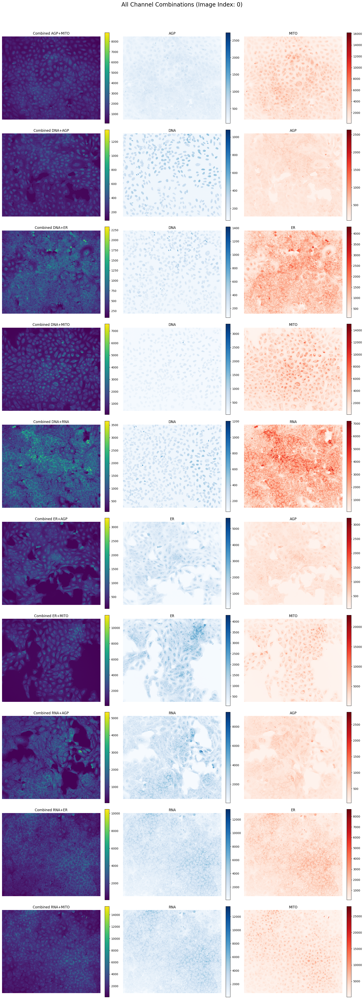

In [11]:
def find_file_case_insensitive(directory, filename_pattern): # move to dataset specific scripts
    """Find a file in a directory regardless of case sensitivity"""
    import os
    
    if not os.path.exists(directory):
        return None
        
    for file in os.listdir(directory):
        if file.lower() == filename_pattern.lower():
            return os.path.join(directory, file)
            
    # Try with uppercase/lowercase variations
    for file in os.listdir(directory):
        if file.lower().startswith(filename_pattern.split('_')[0].lower()) and \
           file.lower().endswith(filename_pattern.split('_')[-1].lower()):
            return os.path.join(directory, file)
            
    return None

def find_dir_case_insensitive(base_dir, target_dir):
    """Find directory regardless of case sensitivity"""
    import os
    
    if os.path.exists(os.path.join(base_dir, target_dir)):
        return os.path.join(base_dir, target_dir)
    
    for item in os.listdir(base_dir):
        if item.lower() == target_dir.lower() and os.path.isdir(os.path.join(base_dir, item)):
            return os.path.join(base_dir, item)
    
    return None

def view_channel_combinations(image_idx=0, debug=False):
    """
    View all channel combinations with proper case handling
    
    Parameters:
    -----------
    image_idx : int
        Which image number to display (0, 1, 2, etc.)
    debug : bool
        Whether to print debug info
    """
    import os
    import glob
    import tifffile
    import matplotlib.pyplot as plt
    import numpy as np
    
    # List all dataset directories
    dataset_dirs = sorted(glob.glob("microsplit_*_dataset"))
    
    # Create a figure
    num_rows = len(dataset_dirs)
    fig, axes = plt.subplots(num_rows, 3, figsize=(18, 5 * num_rows))
    
    # If there's only one row, make sure axes is 2D
    if num_rows == 1:
        axes = np.expand_dims(axes, axis=0)
    
    for i, dataset_dir in enumerate(dataset_dirs):
        # Extract channel names from directory name
        dir_name = os.path.basename(dataset_dir)
        channels_str = dir_name.replace("microsplit_", "").replace("_dataset", "")
        channels = channels_str.split("_")
        
        if debug:
            print(f"\nDataset: {dataset_dir}")
            print(f"  Channels from dir name: {channels}")
        
        # Find case-insensitive directory paths
        combined_dir = find_dir_case_insensitive(dataset_dir, 'combined')
        ch1_dir = find_dir_case_insensitive(dataset_dir, channels[0])
        ch2_dir = find_dir_case_insensitive(dataset_dir, channels[1])
        
        if debug:
            print(f"  Combined dir: {combined_dir}")
            print(f"  Channel 1 dir: {ch1_dir}")
            print(f"  Channel 2 dir: {ch2_dir}")
        
        if not combined_dir or not ch1_dir or not ch2_dir:
            if debug:
                print(f"  Missing directories!")
            
            for j in range(3):
                if not combined_dir and j == 0:
                    message = "Combined directory not found"
                elif not ch1_dir and j == 1:
                    message = f"{channels[0]} directory not found"
                elif not ch2_dir and j == 2:
                    message = f"{channels[1]} directory not found"
                else:
                    message = "Directory not found"
                    
                axes[i, j].text(0.5, 0.5, message,
                              horizontalalignment='center',
                              verticalalignment='center',
                              transform=axes[i, j].transAxes,
                              fontsize=14)
                axes[i, j].axis('off')
            continue
            
        # Get combined image file
        combined_files = sorted([f for f in os.listdir(combined_dir) if f.endswith('.tif')])
        if not combined_files or image_idx >= len(combined_files):
            if debug:
                print(f"  No files found or image_idx out of range")
            
            for j in range(3):
                axes[i, j].text(0.5, 0.5, "No images available",
                              horizontalalignment='center',
                              verticalalignment='center',
                              transform=axes[i, j].transAxes,
                              fontsize=14)
                axes[i, j].axis('off')
            continue
        
        # Get target file ID
        combined_file = combined_files[image_idx]
        img_id = combined_file.split('_')[1]
        
        # Find the actual files with proper capitalization
        combined_path = os.path.join(combined_dir, combined_file)
        
        # For channel files, we need to search with case-insensitivity
        ch1_pattern = f"img_{img_id}_{channels[0]}.tif"
        ch2_pattern = f"img_{img_id}_{channels[1]}.tif"
        
        ch1_file = find_file_case_insensitive(ch1_dir, ch1_pattern)
        ch2_file = find_file_case_insensitive(ch2_dir, ch2_pattern)
        
        if debug:
            print(f"  Combined file: {combined_path}")
            print(f"  Channel 1 file: {ch1_file}")
            print(f"  Channel 2 file: {ch2_file}")
        
        try:
            if os.path.exists(combined_path) and ch1_file and ch2_file:
                combined_img = tifffile.imread(combined_path)
                ch1_img = tifffile.imread(ch1_file)
                ch2_img = tifffile.imread(ch2_file)
                
                # Plot combined image
                im0 = axes[i, 0].imshow(combined_img, cmap='viridis')
                axes[i, 0].set_title(f"Combined {channels[0].upper()}+{channels[1].upper()}")
                plt.colorbar(im0, ax=axes[i, 0], fraction=0.046, pad=0.04)
                
                # Plot channel 1
                im1 = axes[i, 1].imshow(ch1_img, cmap='Blues')
                axes[i, 1].set_title(f"{channels[0].upper()}")
                plt.colorbar(im1, ax=axes[i, 1], fraction=0.046, pad=0.04)
                
                # Plot channel 2
                im2 = axes[i, 2].imshow(ch2_img, cmap='Reds')
                axes[i, 2].set_title(f"{channels[1].upper()}")
                plt.colorbar(im2, ax=axes[i, 2], fraction=0.046, pad=0.04)
                
                # Turn off axis labels
                for ax in axes[i]:
                    ax.axis('off')
            else:
                # Files not found
                missing_files = []
                if not os.path.exists(combined_path): 
                    missing_files.append("combined")
                if not ch1_file: 
                    missing_files.append(channels[0])
                if not ch2_file: 
                    missing_files.append(channels[1])
                
                for j in range(3):
                    axes[i, j].text(0.5, 0.5, f"Missing files: {', '.join(missing_files)}",
                                  horizontalalignment='center',
                                  verticalalignment='center',
                                  transform=axes[i, j].transAxes,
                                  fontsize=14)
                    axes[i, j].axis('off')
        except Exception as e:
            # Error loading files
            for j in range(3):
                axes[i, j].text(0.5, 0.5, f"Error: {str(e)}",
                              horizontalalignment='center',
                              verticalalignment='center',
                              transform=axes[i, j].transAxes,
                              fontsize=14)
                axes[i, j].axis('off')
            if debug:
                print(f"  Error loading files: {str(e)}")
    
    plt.suptitle(f"All Channel Combinations (Image Index: {image_idx})", fontsize=20)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

# View the data
view_channel_combinations(image_idx=0, debug=True)

### Verify you have all the correct files to proceed with the next steps. 

In [12]:
def verify_dataset_structure(dataset_dir): # move to dataset specific scripts
    """Verify the structure of a μSplit dataset directory."""
    # Get channel names from directory name
    dir_name = os.path.basename(dataset_dir)
    channels_lower = dir_name.replace("microsplit_", "").replace("_dataset", "").split("_")
    
    # Find the proper case for channel directories
    channel_dirs = []
    for ch in channels_lower:
        # Look for directory with matching name (ignoring case)
        for item in os.listdir(dataset_dir):
            if item.lower() == ch.lower() and os.path.isdir(os.path.join(dataset_dir, item)):
                channel_dirs.append(item)
                break
    
    # Also check combined directory
    combined_dir = os.path.join(dataset_dir, 'combined')
    
    # Add combined to the list of directories to check
    channels_to_check = channel_dirs + ['combined']
    
    # Check directory structure
    for channel in channels_to_check:
        channel_dir = os.path.join(dataset_dir, channel)
        if not os.path.exists(channel_dir):
            print(f"ERROR: {channel_dir} does not exist!")
            return
    
    # Count files
    file_counts = {}
    for channel in channels_to_check:
        channel_dir = os.path.join(dataset_dir, channel)
        files = [f for f in os.listdir(channel_dir) if f.endswith('.tif')]
        file_counts[channel] = len(files)
    
    # Print summary
    print(f"Dataset structure verification for: {dataset_dir}")
    print(f"{'Channel':<10} | {'File Count':<10}")
    print("-" * 25)
    for channel, count in file_counts.items():
        print(f"{channel:<10} | {count:<10}")
    
    # Verify counts match
    if len(set(file_counts.values())) == 1:
        print(f"\n✅ All channels have the same number of files: {next(iter(file_counts.values()))}")
    else:
        print(f"\n⚠️ WARNING: Channel file counts don't match!")
    
    # Sample check for matching file IDs
    combined_files = os.listdir(combined_dir)
    if combined_files:
        sample_id = combined_files[0].split('_')[1]
        
        print(f"\nVerifying files with ID {sample_id} exist for all channels:")
        for channel in channels_to_check:
            # Construct the expected filename based on the channel
            if channel == 'combined':
                expected_file = f"img_{sample_id}_combined.tif"
            else:
                expected_file = f"img_{sample_id}_{channel}.tif"
            
            file_path = os.path.join(dataset_dir, channel, expected_file)
            exists = os.path.exists(file_path)
            print(f"{expected_file:<30} : {'✅ Exists' if exists else '❌ Missing'}")

execute the 'verify_dataset_structure' function

In [14]:
import glob
for dataset_dir in sorted(glob.glob("microsplit_*_dataset")):
    verify_dataset_structure(dataset_dir)
    print("\n" + "="*50 + "\n")

Dataset structure verification for: microsplit_agp_mito_dataset
Channel    | File Count
-------------------------
AGP        | 50        
Mito       | 50        
combined   | 50        

✅ All channels have the same number of files: 50

Verifying files with ID 00002 exist for all channels:
img_00002_AGP.tif              : ✅ Exists
img_00002_Mito.tif             : ✅ Exists
img_00002_combined.tif         : ✅ Exists


Dataset structure verification for: microsplit_dna_agp_dataset
Channel    | File Count
-------------------------
DNA        | 50        
AGP        | 50        
combined   | 50        

✅ All channels have the same number of files: 50

Verifying files with ID 00002 exist for all channels:
img_00002_DNA.tif              : ✅ Exists
img_00002_AGP.tif              : ✅ Exists
img_00002_combined.tif         : ✅ Exists


Dataset structure verification for: microsplit_dna_er_dataset
Channel    | File Count
-------------------------
DNA        | 50        
ER         | 50        
com

### Now you can use the datasets created to generate noise models for each channel in the dataset using the 01JUMP_noisemodels notebook. 